## Deep Learning Homework 2

File updates and things that need to be done to complete this homework:

Question 1:
Analytically find the weights for MLP for the "A" problem.

- State the smallest number of hidden units the network needs i neach layer and describe their role in creating the mask. 

- Can you achieve the same goal with a single hidden layer network? 

Question 2:
Train and test data has been processed for this.
    - May need to look into creating additional training data. 
    Treating the given points as a mean may prove to be beneficial.

Section six.5.4 describes how back propagation works in MLP. May be useful.

Need to structure the report..

REQUIREMENTS:
- VERSION 1: Non augmented data and non-accelerated training
    - Model Complete? (DONE)
- VERSION 2: Augmented training data with better and faster training
    - Model Complete? (DONE)

- Show the sample spaces for each of versions to demonstrate the differences in samples
- Show the learning curves of each model to illustrate training improvements from differences in version 2 (DONE)
- Describe your experience
- Answer, is there just one possible solution (i.e. one single set of parameters to exactly separate the two classes?)


In [129]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.inspection import DecisionBoundaryDisplay

## Question 1

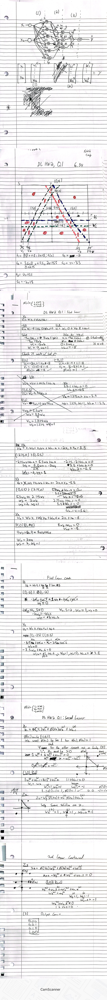

In [136]:
from PIL import Image
Image.open('Q1_DLHW2.jpg')

## Question 2

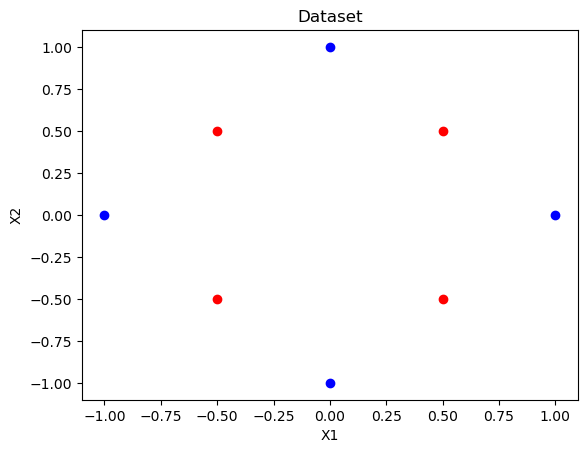

In [130]:
# Write the dataset 

X = np.array([[1, 0],
              [0, 1],
              [-1, 0],
              [0, -1],
              [0.5, 0.5],
              [-0.5, 0.5],
              [0.5, -0.5],
              [-0.5, -0.5]])

y = np.array([[1],
              [1],
              [1],
              [1],
              [0],
              [0],
              [0],
              [0]])

# plot the dataset
plt.scatter(X[0:4, 0], X[0:4, 1], color='blue')
plt.scatter(X[4:8, 0], X[4:8, 1], color='red')
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('Dataset')
plt.show()

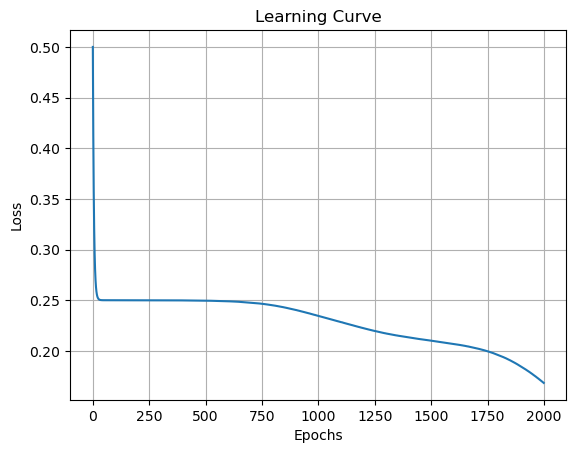

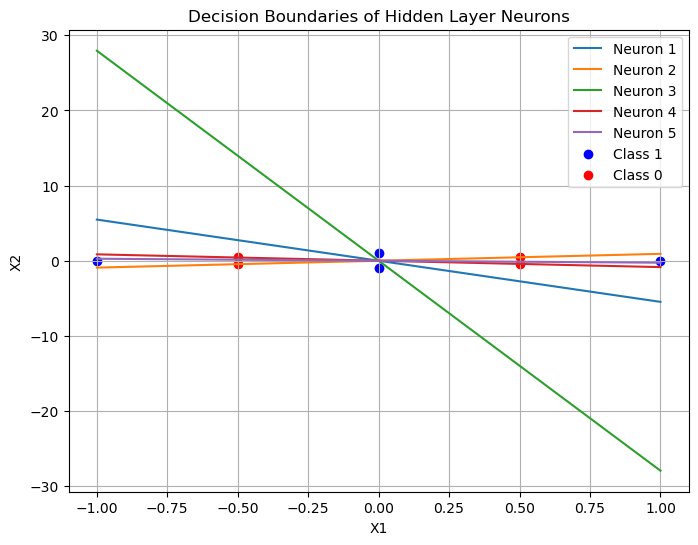

In [131]:
class SingleLayerMLP:
    def __init__(self, input_dim, hidden_dim, output_dim, lr=0.01):
        self.W1 = np.random.randn(input_dim, hidden_dim) * 0.01  # Small random weights
        self.b1 = np.zeros((1, hidden_dim))  # Zero biases
        self.W2 = np.random.randn(hidden_dim, output_dim) * 0.01  # Small random weights
        self.b2 = np.zeros((1, output_dim))  # Zero biases
        self.lr = lr  # Learning rate

    # Forward pass
    def forward_pass(self, X):
        self.Z1 = np.dot(X, self.W1) + self.b1 # linear transformation
        self.A1 = self._relu(self.Z1) # activation function
        self.Z2 = np.dot(self.A1, self.W2) + self.b2 # linear transformation
        self.A2 = self.Z2  # No activation function in the output layer
        return self.A2
    
    # Relu
    def _relu(self, z):
        return np.maximum(0, z)

    # Relu Derivative
    def _relu_derivative(self, z):
        return np.where(z > 0, 1, 0)

    def backward_pass(self, X, y):
        # define the number of training examples
        m = X.shape[0]
        
        # Compute error
        error_output = self.A2 - y
        
        # Backpropagate the gradient
        dZ2 = error_output  
        
        # Copmute error of hidden layer
        error_hidden = np.dot(dZ2, self.W2.T)
        
        # Backpropagate the gradient
        dZ1 = error_hidden * self._relu_derivative(self.Z1)
        
        # Update equations
        # output layer equations
        self.W2 -= (self.lr / m) * np.dot(self.A1.T, dZ2) # Update weights for output layer
        self.b2 -= (self.lr / m) * np.sum(dZ2, axis=0, keepdims=True) # Update biases for output layer
        
        # hidden layer equations
        self.W1 -= (self.lr / m) * np.dot(X.T, dZ1) # Update weights for hidden layer
        self.b1 -= (self.lr / m) * np.sum(dZ1, axis=0, keepdims=True) # Update biases for hidden layer

    def train(self, X, y, epochs=1000):
        self.loss_history = []
        for epoch in range(epochs):
            self.forward_pass(X)
            self.backward_pass(X, y)
            loss = np.mean((self.A2 - y) ** 2)  # Mean squared error
            self.loss_history.append(loss)

    def plot_learning_curve(self):
        plt.plot(self.loss_history)
        plt.title('Learning Curve')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.grid()
        plt.show()
        
    def decision_boundary(self, X):
        # use sklearn's DecisionBoundaryDisplay
        display = DecisionBoundaryDisplay.from_estimator(self, X, y)
        display.plot()
        plt.show()
    
    def plot_discriminants(self):
        plt.figure(figsize=(8, 6))
        x1 = np.linspace(-1, 1, 50)
        
        for i in range(self.W1.shape[1]):
            v = self.W1[:, i]
            x2 = -(v[0] * x1) / v[1]
            plt.plot(x1, x2, label=f'Neuron {i+1}')
        
        plt.scatter(X[0:4, 0], X[0:4, 1], color='blue', label='Class 1')
        plt.scatter(X[4:8, 0], X[4:8, 1], color='red', label='Class 0')
        plt.xlabel('X1')
        plt.ylabel('X2')
        plt.title('Decision Boundaries of Hidden Layer Neurons')
        plt.legend()
        plt.grid()
        plt.show()
        
# Create and train the model
model = SingleLayerMLP(input_dim=2, hidden_dim=5, output_dim=1, lr=0.1)
model.train(X, y, epochs=2000)

# Plot the learning curve
model.plot_learning_curve()

# plot the decision boundary
model.plot_discriminants()



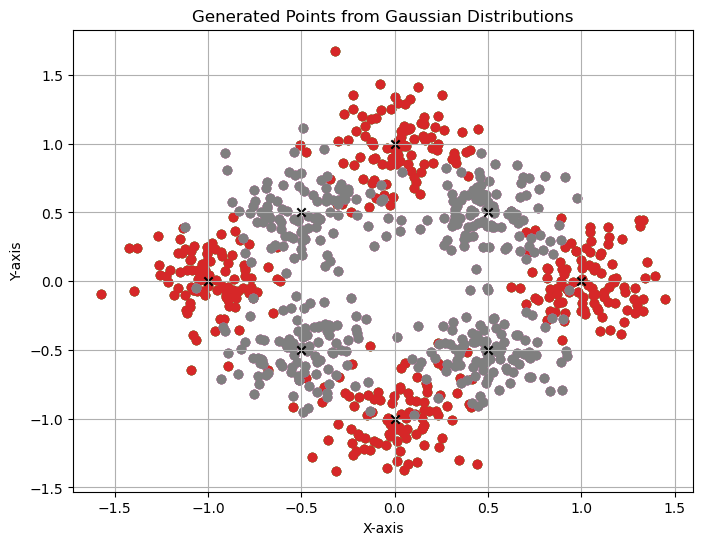

In [132]:
def generate_gaussian_points(means, n_points, variance_x, variance_y):
    points = []
    labels = []
    
    # Generate points for each mean
    for mean in means:
        # Generate random points from a Gaussian distribution
        x_points = np.random.normal(loc=mean[0], scale=variance_x, size=n_points)
        y_points = np.random.normal(loc=mean[1], scale=variance_y, size=n_points)
        
        # Combine x and y points and assign labels
        for x, y in zip(x_points, y_points):
            points.append([x, y])
            labels.append([mean[2]]) # Assign the label from the means array
    
    return np.array(points), np.array(labels)

# Define means with corresponding class labels
means = np.array([
    [1, 0, 1],
    [0, 1, 1],
    [-1, 0, 1],
    [0, -1, 1],
    [0.5, 0.5, 0],
    [-0.5, 0.5, 0],
    [0.5, -0.5, 0],
    [-0.5, -0.5, 0]
])

# Parameters
n_points_per_class = 100  # Number of points to generate for each class
variance_x = 0.2 # Variance in the x direction
variance_y = 0.2 # Variance in the y direction

# Generate points and labels
X_generated, y_generated = generate_gaussian_points(means, n_points_per_class, variance_x, variance_y)

plt.figure(figsize=(8, 6))
for mean in means:
    plt.scatter(
        X_generated[y_generated.flatten() == mean[2], 0], 
        X_generated[y_generated.flatten() == mean[2], 1], 
    )

plt.scatter(means[:, 0], means[:, 1], color='black', marker='x', label='Means')
plt.title('Generated Points from Gaussian Distributions')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.grid()
plt.show()


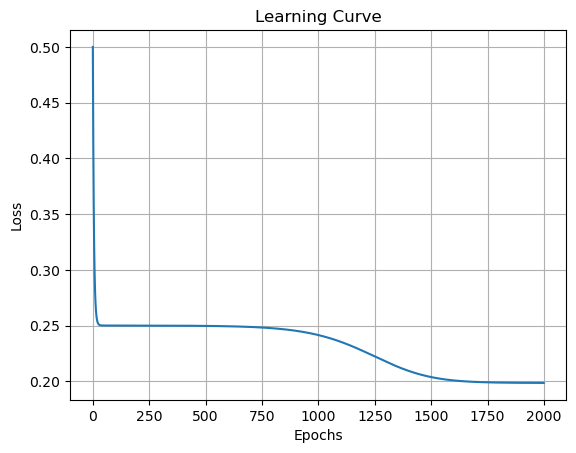

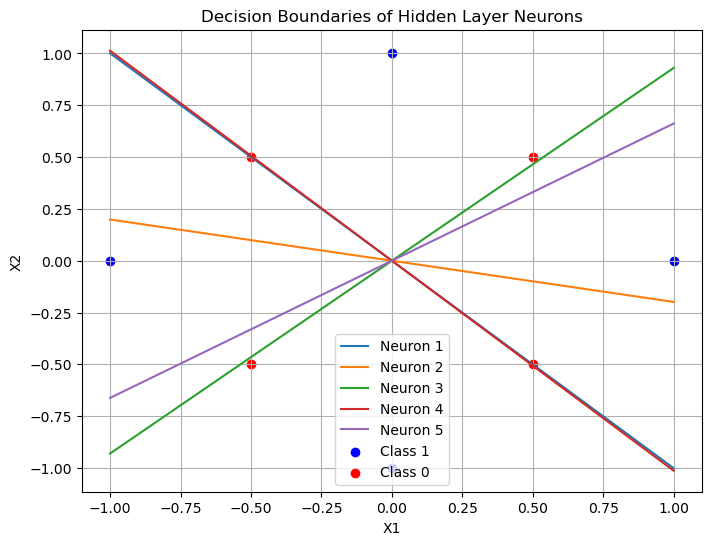

In [133]:
model = SingleLayerMLP(input_dim=2, hidden_dim=5, output_dim=1, lr=0.1)
model.train(X_generated, y_generated, epochs=2000)
model.plot_learning_curve()
model.plot_discriminants()